## 1. Python Packages

In [1]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [2]:
import numpy as np
# Numpy stands for Numerical Python is a package for scientific computing
import pandas as pd
# Pandas stands for Panel Datas is a Python Data Analysis Library
import matplotlib.pyplot as plt
# Matplotlib is the plotting package that we'll use
import sklearn
# Scikit-learn is a machine learning package, providing the backbone for our work
from sklearn import tree
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold,RepeatedKFold
from sklearn.model_selection import cross_validate,GridSearchCV,ParameterGrid
from math import sqrt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from sklearn.tree import export_graphviz

## 2. Importing the DataFrame

In [3]:
df = pd.read_csv("compiled-set-1.csv")
df.head()

,conc,micros,adc1
0,0,216,1.163245
1,0,1322716,1.163245
2,0,1346724,1.163245
3,0,1370732,1.163245
4,0,1394904,1.163245


## 3. Splitting Targets and Features

### 3.1. Export Features

In [4]:
x = df[['conc','micros']]

### 3.2. Read Features

In [5]:
x.head()
# First 5 sets are shown

,conc,micros
0,0,216
1,0,1322716
2,0,1346724
3,0,1370732
4,0,1394904


### 3.3. Export Targets

In [6]:
y = df['adc1']

### 3.4. Read Targets

In [7]:
y.head()
# Outputs correspond to First 5 Feature sets are shown

0    1.163245
1    1.163245
2    1.163245
3    1.163245
4    1.163245
Name: adc1, dtype: float64

## 4. Setting Up Model Evaluation

In [8]:
# Generate train/test split by reserving 20% of data as test set
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=1)

### 4.1. Fitting A Linear Regression Model

In [9]:
# Creating object for Linear Regression
LR = LinearRegression()

In [10]:
# fit/train the linear regression model
LR.fit(x_train,y_train)

LinearRegression()

In [11]:
# Make predictions on test data
LR_pred = LR.predict(x_test)

### 4.2. Multivariable Polynomial Regression

In [12]:
# Transforming Features into Polynomial Features
PF = PolynomialFeatures(degree=5)

In [13]:
x_train_poly = PF.fit_transform(x_train)
x_test_poly = PF.fit_transform(x_test)

In [14]:
# Fit the Linear Regression Model
LR.fit(x_train_poly,y_train)

# Make predictions on test and train data
x_test_predp = LR.predict(x_test_poly)
x_train_predp = LR.predict(x_train_poly)

In [15]:
# Accuracy of prediction for test data using LinearRegression model
LR.score(x_test_poly,y_test)

0.3581898919450647

In [16]:
# Accuracy of prediction for train data using LinearRegression model
LR.score(x_train_poly,y_train)

0.42573947918886523

In [17]:
def rmse(y_true, Y_predictions): return round(np.sqrt(metrics.mean_squared_error(y_true, Y_predictions)),4)
def rmse_std(y_true, Y_predictions): return round(rmse(y_true, Y_predictions)/np.std(y_true),4)
def mae(y_true, Y_predictions): return round(metrics.mean_absolute_error(y_true, Y_predictions),4)
def r2(y_true, Y_predictions): return round(metrics.r2_score(y_true, Y_predictions),4)

In [18]:
def parity_stats(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left,title_right):
    rmse_left = rmse(y_left_true,Y_left_predictions)
    rmse_std_left = rmse_std(y_left_true,Y_left_predictions)
    mae_left = mae(y_left_true,Y_left_predictions)
    r2_left = r2(y_left_true,Y_left_predictions)
    rmse_right = rmse(y_right_true,Y_right_predictions)
    rmse_std_right = rmse_std(y_right_true,Y_right_predictions)
    mae_right = mae(y_right_true,Y_right_predictions)
    r2_right = r2(y_right_true,Y_right_predictions)
    stats_df = pd.DataFrame({'Error Metric' : ['RMSE', 'RMSE/std', 'MAE', 'R2'],
    title_left : [str(rmse_left), rmse_std_left, str(mae_left), r2_left], title_right: [str(rmse_right), rmse_std_right, str(mae_right), r2_right],'Note' : ['(0.0 for perfect prediction)', '(0.0 for perfect prediction)','(0.0 for perfect prediction)','(1.0 for perfect prediction)']})
    return stats_df

In [19]:
def parity_plots(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left="Training",title_right="Test"):
    fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(10,4))
    ax1.scatter(y_left_true, Y_left_predictions, edgecolors=(0, 0, 0))
    ax1.plot([y_left_true.min(), y_left_true.max()], [y_left_true.min(),y_left_true.max()], 'k--', lw=4)
    ax1.legend(["Actual", "Prediction"])
    ax1.set_xlabel('Actual Voltage')
    ax1.set_ylabel('Predicted Voltage')
    ax1.set_title(title_left)
    ax2.scatter(y_right_true, Y_right_predictions, edgecolors=(0, 0, 0))
    ax2.plot([y_right_true.min(), y_right_true.max()], [y_right_true.min(), y_right_true.max()], 'k--', lw=4)
    ax2.legend(["Actual", "Prediction"])
    ax2.set_xlabel('Actual Voltage')
    ax2.set_ylabel('Predicted Voltage')
    ax2.set_title(title_right)
    plt.savefig("parity_rf.jpg",dpi=300)
    plt.show()

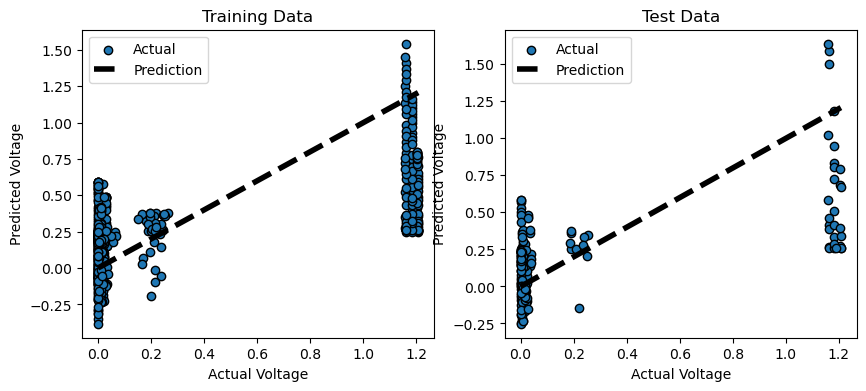

,Error Metric,Training Data,Test Data,Note
0,RMSE,0.3451,0.3654,(0.0 for perfect prediction)
1,RMSE/std,0.7578,0.801,(0.0 for perfect prediction)
2,MAE,0.2597,0.2668,(0.0 for perfect prediction)
3,R2,0.4257,0.3582,(1.0 for perfect prediction)


In [20]:
parity_plots(y_train,x_train_predp,y_test,x_test_predp,title_left="Training Data",title_right="Test Data")
parity_stats(y_train,x_train_predp,y_test,x_test_predp,"Training Data","Test Data") 
# print error metrics for training data

### 4.3. Support Vector Regression

In [21]:
# Creating object for Support Vector Regression
SV = SVR()

In [22]:
# fit/train the Support Vector Regression model
SV.fit(x_train,y_train)

SVR()

In [23]:
# Make predictions on test and train data
SV_test_pred = SV.predict(x_test)
SV_train_pred = SV.predict(x_train)

In [24]:
# Accuracy of prediction for test data using current model
SV.score(x_test,y_test)

-0.09822820105166397

In [25]:
def rmse(y_true, Y_predictions): return round(np.sqrt(metrics.mean_squared_error(y_true, Y_predictions)),4)
def rmse_std(y_true, Y_predictions): return round(rmse(y_true, Y_predictions)/np.std(y_true),4)
def mae(y_true, Y_predictions): return round(metrics.mean_absolute_error(y_true, Y_predictions),4)
def r2(y_true, Y_predictions): return round(metrics.r2_score(y_true, Y_predictions),4)

In [26]:
def parity_stats(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left,title_right):
    rmse_left = rmse(y_left_true,Y_left_predictions)
    rmse_std_left = rmse_std(y_left_true,Y_left_predictions)
    mae_left = mae(y_left_true,Y_left_predictions)
    r2_left = r2(y_left_true,Y_left_predictions)

    rmse_right = rmse(y_right_true,Y_right_predictions)
    rmse_std_right = rmse_std(y_right_true,Y_right_predictions)
    mae_right = mae(y_right_true,Y_right_predictions)
    r2_right = r2(y_right_true,Y_right_predictions)

    stats_df = pd.DataFrame({'Error Metric' : ['RMSE','RMSE/std','MAE','R2'], title_left: [str(rmse_left), rmse_std_left, str(mae_left), r2_left], title_right: [str(rmse_right), rmse_std_right, str(mae_right), r2_right], 'Note': ['(0.0 for prefect prediction)', '(0.0 for prefect prediction)', '(0.0 for perfect prediction)', '(1.0 for perfect prediction)']})
    return stats_df

In [27]:
def parity_plots(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left="Training",title_right="Test"):
    fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(16,6))
    ax1.scatter(y_left_true, Y_left_predictions, edgecolors=(0, 0, 0))
    ax1.plot([y_left_true.min(), y_left_true.max()], [y_left_true.min(),y_left_true.max()], 'k--', lw=4)
    ax1.legend(["Actual", "Prediction"])
    ax1.set_xlabel('Actual Voltage')
    ax1.set_ylabel('Predicted Voltage')
    ax1.set_title(title_left)
    ax2.scatter(y_right_true, Y_right_predictions, edgecolors=(0, 0, 0))
    ax2.plot([y_right_true.min(), y_right_true.max()], [y_right_true.min(),y_right_true.max()], 'k--', lw=4)
    ax2.legend(["Actual", "Prediction"])
    ax2.set_xlabel('Actual Voltage')
    ax2.set_ylabel('Predicted Voltage')
    ax2.set_title(title_right)
    plt.savefig("parity.jpg",dpi=300)
    plt.show()

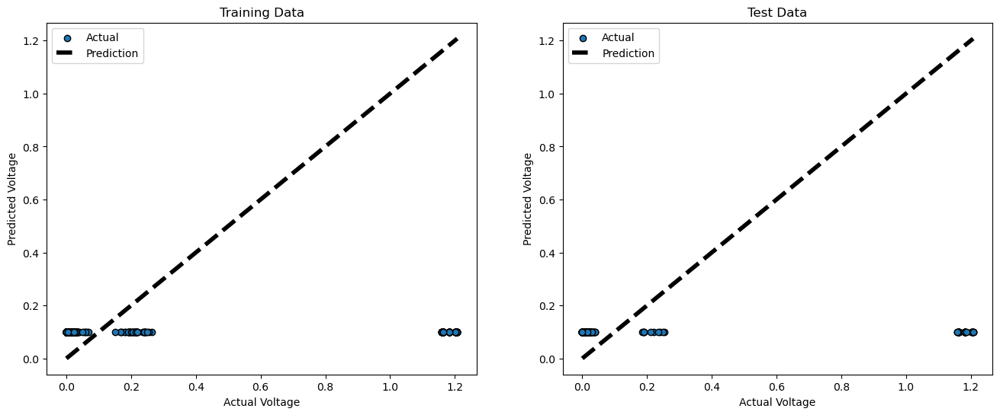

,Error Metric,Training Data,Test Data,Note
0,RMSE,0.4765,0.478,(0.0 for prefect prediction)
1,RMSE/std,1.0463,1.0479,(0.0 for prefect prediction)
2,MAE,0.2788,0.2802,(0.0 for perfect prediction)
3,R2,-0.095,-0.0982,(1.0 for perfect prediction)


In [28]:
parity_plots(y_train, SV_train_pred, y_test, SV_test_pred, title_left="Training Data", title_right="Test Data")
parity_stats(y_train, SV_train_pred, y_test, SV_test_pred, "Training Data", "Test Data")  # print error metrics for training data

### 4.4. K-Nearest Neighbors Regression

In [29]:
# Creating object for KNN Regression
knn = KNeighborsRegressor(n_neighbors=4)

In [30]:
# fit/train the KNN Regression model
knn.fit(x_train,y_train)

KNeighborsRegressor(n_neighbors=4)

In [31]:
# Accuracy of prediction for test data using KNN Regression model
knn.score(x_test,y_test)

0.33429697766021704

In [32]:
# Accuracy of prediction for train data using KNN Regression model
knn.score(x_train,y_train)

0.6560104549430679

In [33]:
# Make predictions on test and train data
knn_test_pred = knn.predict(x_test)
knn_train_pred = knn.predict(x_train)

In [34]:
def rmse(y_true, Y_predictions): return round(np.sqrt(metrics.mean_squared_error(y_true, Y_predictions)),4)
def rmse_std(y_true, Y_predictions): return round(rmse(y_true, Y_predictions)/np.std(y_true),4)
def mae(y_true, Y_predictions): return round(metrics.mean_absolute_error(y_true, Y_predictions),4)
def r2(y_true, Y_predictions): return round(metrics.r2_score(y_true, Y_predictions),4)

In [35]:
def parity_stats(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left,title_right):
    rmse_left = rmse(y_left_true,Y_left_predictions)
    rmse_std_left = rmse_std(y_left_true,Y_left_predictions)
    mae_left = mae(y_left_true,Y_left_predictions)
    r2_left = r2(y_left_true,Y_left_predictions)

    rmse_right = rmse(y_right_true,Y_right_predictions)
    rmse_std_right = rmse_std(y_right_true,Y_right_predictions)
    mae_right = mae(y_right_true,Y_right_predictions)
    r2_right = r2(y_right_true,Y_right_predictions)

    stats_df = pd.DataFrame({'Error Metric' : ['RMSE','RMSE/std','MAE','R2'], title_left: [str(rmse_left), rmse_std_left, str(mae_left), r2_left], title_right: [str(rmse_right), rmse_std_right, str(mae_right), r2_right], 'Note': ['(0.0 for prefect prediction)', '(0.0 for prefect prediction)', '(0.0 for perfect prediction)', '(1.0 for perfect prediction)']})
    return stats_df

In [36]:
def parity_plots(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left="Training",title_right="Test"):
    fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(16,6))
    ax1.scatter(y_left_true, Y_left_predictions, edgecolors=(0, 0, 0))
    ax1.plot([y_left_true.min(), y_left_true.max()], [y_left_true.min(),y_left_true.max()], 'k--', lw=4)
    ax1.legend(["Actual", "Prediction"])
    ax1.set_xlabel('Actual Voltage')
    ax1.set_ylabel('Predicted Voltage')
    ax1.set_title(title_left)
    ax2.scatter(y_right_true, Y_right_predictions, edgecolors=(0, 0, 0))
    ax2.plot([y_right_true.min(), y_right_true.max()], [y_right_true.min(),y_right_true.max()], 'k--', lw=4)
    ax2.legend(["Actual", "Prediction"])
    ax2.set_xlabel('Actual Voltage')
    ax2.set_ylabel('Predicted Voltage')
    ax2.set_title(title_right)
    plt.savefig("parity.jpg",dpi=300)
    plt.show()

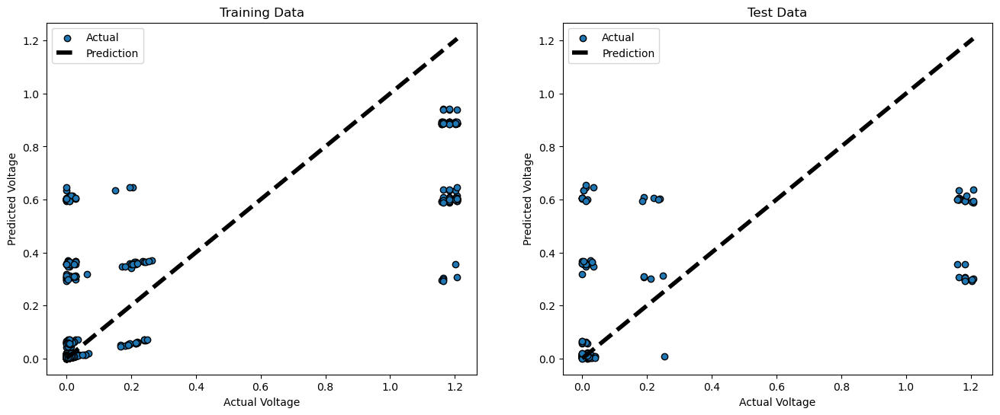

,Error Metric,Training Data,Test Data,Note
0,RMSE,0.2671,0.3722,(0.0 for prefect prediction)
1,RMSE/std,0.5865,0.8159,(0.0 for prefect prediction)
2,MAE,0.1569,0.2302,(0.0 for perfect prediction)
3,R2,0.656,0.3343,(1.0 for perfect prediction)


In [37]:
parity_plots(y_train, knn_train_pred, y_test, knn_test_pred, title_left="Training Data", title_right="Test Data")
parity_stats(y_train, knn_train_pred, y_test, knn_test_pred, "Training Data", "Test Data")  # print error metrics for training data

## 4.5. Fitting A Decision Tree Model

### 4.5.1. Using Extreme Gradient Boosting Algorithm

In [38]:
# Creating object for Extreme Gradient Boosting Regression
XGB = XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1,
             colsample_bytree=1, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, gamma=0, gpu_id=1, grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0,
             min_child_weight=1, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1,
             predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1)

In [39]:
# fit/train the Decision Tree model
XGB.fit(x_train,y_train)

[21:55:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:347: Only 1 GPUs are visible, setting `gpu_id` to 0


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=None, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [40]:
Train_predictions = XGB.predict(x_train)
# Make predictions on training data
Test_predictions = XGB.predict(x_test)
# Make predictions on testing data

In [41]:
def rmse(y_true, Y_predictions): return round(np.sqrt(metrics.mean_squared_error(y_true, Y_predictions)),4)
def rmse_std(y_true, Y_predictions): return round(rmse(y_true, Y_predictions)/np.std(y_true),4)
def mae(y_true, Y_predictions): return round(metrics.mean_absolute_error(y_true, Y_predictions),4)
def r2(y_true, Y_predictions): return round(metrics.r2_score(y_true, Y_predictions),4)

In [42]:
def parity_stats(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left,title_right):
    rmse_left = rmse(y_left_true,Y_left_predictions)
    rmse_std_left = rmse_std(y_left_true,Y_left_predictions)
    mae_left = mae(y_left_true,Y_left_predictions)
    r2_left = r2(y_left_true,Y_left_predictions)

    rmse_right = rmse(y_right_true,Y_right_predictions)
    rmse_std_right = rmse_std(y_right_true,Y_right_predictions)
    mae_right = mae(y_right_true,Y_right_predictions)
    r2_right = r2(y_right_true,Y_right_predictions)

    stats_df = pd.DataFrame({'Error Metric' : ['RMSE','RMSE/std','MAE','R2'], title_left: [str(rmse_left), rmse_std_left, str(mae_left), r2_left], title_right: [str(rmse_right), rmse_std_right, str(mae_right), r2_right], 'Note': ['(0.0 for prefect prediction)', '(0.0 for prefect prediction)', '(0.0 for perfect prediction)', '(1.0 for perfect prediction)']})
    return stats_df

In [43]:
def parity_plots(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left="Training",title_right="Test"):
    fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(16,6))
    ax1.scatter(y_left_true, Y_left_predictions, edgecolors=(0, 0, 0))
    ax1.plot([y_left_true.min(), y_left_true.max()], [y_left_true.min(),y_left_true.max()], 'k--', lw=4)
    ax1.legend(["Actual", "Prediction"])
    ax1.set_xlabel('Actual Voltage')
    ax1.set_ylabel('Predicted Voltage')
    ax1.set_title(title_left)
    ax2.scatter(y_right_true, Y_right_predictions, edgecolors=(0, 0, 0))
    ax2.plot([y_right_true.min(), y_right_true.max()], [y_right_true.min(),y_right_true.max()], 'k--', lw=4)
    ax2.legend(["Actual", "Prediction"])
    ax2.set_xlabel('Actual Voltage')
    ax2.set_ylabel('Predicted Voltage')
    ax2.set_title(title_right)
    plt.savefig("parity.jpg",dpi=300)
    plt.show()

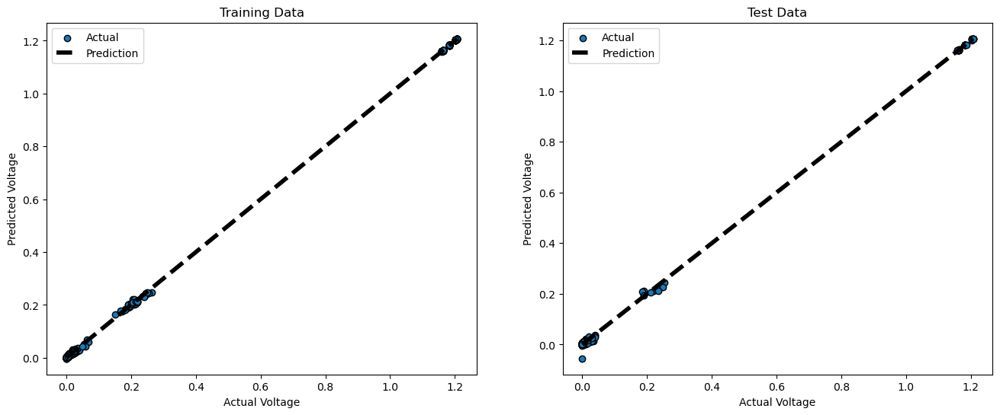

,Error Metric,Training Data,Test Data,Note
0,RMSE,0.0028,0.0072,(0.0 for prefect prediction)
1,RMSE/std,0.0061,0.0158,(0.0 for prefect prediction)
2,MAE,0.0016,0.0039,(0.0 for perfect prediction)
3,R2,1.0,0.9997,(1.0 for perfect prediction)


In [44]:
parity_plots(y_train, Train_predictions, y_test, Test_predictions, title_left="Training Data", title_right="Test Data")
parity_stats(y_train, Train_predictions, y_test, Test_predictions, "Training Data", "Test Data")  # print error metrics for training data

### 4.5.2. Random Forest Regressor Class

In [45]:
# Creating object for Linear Regression
RF=RandomForestRegressor(random_state=1,n_estimators=1,bootstrap=False)

In [46]:
# fit/train the Decision Tree model
RF.fit(x_train,y_train)

RandomForestRegressor(bootstrap=False, n_estimators=1, random_state=1)

In [47]:
# Make predictions on test data
RF_pred = RF.predict(x_test)

In [48]:
# Accuracy of prediction for test data using current model
RF.score(x_train,y_train)

1.0

In [49]:
Train_predictions = RF.predict(x_train)
# Make predictions on training data
Test_predictions = RF.predict(x_test)
# Make predictions on testing data

In [50]:
def rmse(y_true, Y_predictions): return round(np.sqrt(metrics.mean_squared_error(y_true, Y_predictions)),4)
def rmse_std(y_true, Y_predictions): return round(rmse(y_true, Y_predictions)/np.std(y_true),4)
def mae(y_true, Y_predictions): return round(metrics.mean_absolute_error(y_true, Y_predictions),4)
def r2(y_true, Y_predictions): return round(metrics.r2_score(y_true, Y_predictions),4)

In [51]:
def parity_stats(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left,title_right):
    rmse_left = rmse(y_left_true,Y_left_predictions)
    rmse_std_left = rmse_std(y_left_true,Y_left_predictions)
    mae_left = mae(y_left_true,Y_left_predictions)
    r2_left = r2(y_left_true,Y_left_predictions)
    rmse_right = rmse(y_right_true,Y_right_predictions)
    rmse_std_right = rmse_std(y_right_true,Y_right_predictions)
    mae_right = mae(y_right_true,Y_right_predictions)
    r2_right = r2(y_right_true,Y_right_predictions)
    stats_df = pd.DataFrame({'Error Metric' : ['RMSE', 'RMSE/std', 'MAE', 'R2'],
    title_left : [str(rmse_left), rmse_std_left, str(mae_left), r2_left], title_right: [str(rmse_right), rmse_std_right, str(mae_right), r2_right],'Note' : ['(0.0 for perfect prediction)', '(0.0 for perfect prediction)','(0.0 for perfect prediction)','(1.0 for perfect prediction)']})
    return stats_df

In [52]:
def parity_plots(y_left_true,Y_left_predictions,y_right_true,Y_right_predictions,title_left="Training",title_right="Test"):
    fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(10,4))
    ax1.scatter(y_left_true, Y_left_predictions, edgecolors=(0, 0, 0))
    ax1.plot([y_left_true.min(), y_left_true.max()], [y_left_true.min(),y_left_true.max()], 'k--', lw=4)
    ax1.legend(["Actual", "Prediction"])
    ax1.set_xlabel('Actual Voltage')
    ax1.set_ylabel('Predicted Voltage')
    ax1.set_title(title_left)
    ax2.scatter(y_right_true, Y_right_predictions, edgecolors=(0, 0, 0))
    ax2.plot([y_right_true.min(), y_right_true.max()], [y_right_true.min(), y_right_true.max()], 'k--', lw=4)
    ax2.legend(["Actual", "Prediction"])
    ax2.set_xlabel('Actual Voltage')
    ax2.set_ylabel('Predicted Voltage')
    ax2.set_title(title_right)
    plt.savefig("parity_rf.jpg",dpi=300)
    plt.show()

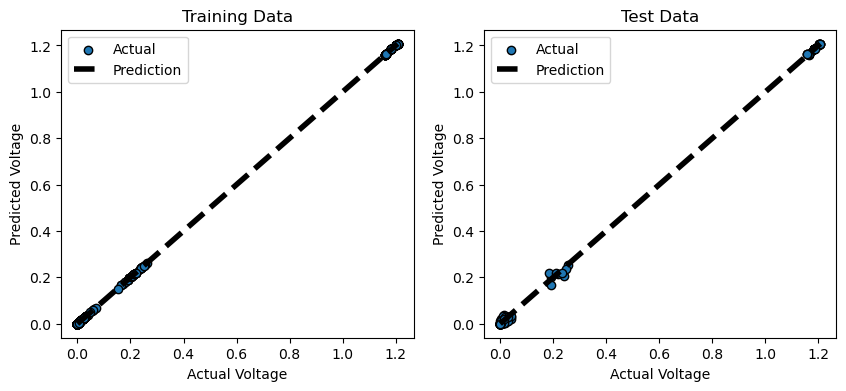

,Error Metric,Training Data,Test Data,Note
0,RMSE,0.0,0.0074,(0.0 for perfect prediction)
1,RMSE/std,0.0,0.0162,(0.0 for perfect prediction)
2,MAE,0.0,0.0036,(0.0 for perfect prediction)
3,R2,1.0,0.9997,(1.0 for perfect prediction)


In [53]:
parity_plots(y_train,Train_predictions,y_test,Test_predictions,title_left="Training Data",title_right="Test Data")
parity_stats(y_train,Train_predictions,y_test,Test_predictions,"Training Data","Test Data") 
# print error metrics for training data

### 5. Making Prediction

In [54]:
 # Make predictions
RF.predict([[50,2000000]])
# Predict voltage generated at a concentration of 50 mg/dL and after 2 seconds|

C:\Program Files\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


array([1.207234])

### 5.1. Visualization of Decision Tree

In [55]:
plt.figure(figsize=(600,200))
tree.plot_tree(RF.estimators_[0], filled=True)
plt.savefig("tree.pdf",dpi=600)